# Final project. Team №1

### Validation of Splitting the Hydrocarbon Plus Fraction: First Step in Tuning Equation of State
### Ali A. Al-Meshari, William D. McCain

# Reproduced by Kalyakin Timofey

## Libraries import

In [61]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

## Data extraction 

In [62]:
#Experimental extended fluid compositions of ten reservoir fluids that
#used to validate splitting the plus fraction method
fluid_composition_data = {
    'Component': [
        'H2S', 'N2', 'CO2', 'C1', 'C2', 'C3', 'i-C4', 'n-C4', 'i-C5', 'n-C5',
        'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'C15',
        'C16', 'C17', 'C18', 'C19', 'C20', 'C21', 'C22', 'C23', 'C24', 'C25',
        'C26', 'C27', 'C28', 'C29', 'C30', 'C31', 'C32', 'C33', 'C34', 'C35',
        'C36', 'C37', 'C38', 'C39', 'С40', 'C41', 'C42', 'C43', 'C44', 'C45'
    ],
    'Fluid_1': [
        0, 0.0029, 0.002, 0.8466, 0.0404, 0.0223, 0.0051, 0.0099, 0.0046, 0.0049,
        0.0068, 0.0099, 0.0051, 0.0112, 0.0051, 0.0038, 0.003, 0.0028, 0.0022, 0.002,
        0.0015, 0.0012, 0.0012, 0.001, 0.0007, 0.0006, 0.0005, 0.0004, 0.0003, 0.0003,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0001, 0.0001, 0.0001, 0.0001, 0.0001, 0.0001, 0.0003,
        np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan
    ],
    'Fluid_2': [
        0, 0.0111, 0, 0.7903, 0.0796, 0.0335, 0.0092, 0.0083, 0.0026, 0.0019,
        0.0023, 0.0059, 0.0092, 0.0062, 0.0044, 0.0032, 0.0024, 0.0026, 0.0024, 0.0024,
        0.0017, 0.0016, 0.0018, 0.0015, 0.0019, 0.0015, 0.0015, 0.0015, 0.0014, 0.0012,
        0.0011, 0.001, 0.0009, 0.0008, 0.0031, np.nan, np.nan, np.nan, np.nan, np.nan, 
        np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan
    ],
    'Fluid_3': [
        0, 0.0047, 0.0242, 0.6822, 0.118, 0.0546, 0.0083, 0.0174, 0.0072, 0.0074, 0.0107,
        0.0109, 0.0147, 0.0095, 0.0065, 0.0044, 0.0033, 0.0031, 0.0024, 0.002, 0.0014,
        0.0012, 0.0011, 0.0009, 0.0039, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, 
        np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, 
        np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan
    ],
    'Fluid_4': [
        0, 0.003, 0.0435, 0.6255, 0.0999, 0.05, 0.0131, 0.022, 0.0103, 0.0093, 0.0147, 0.017,
        0.0195, 0.0146, 0.0105, 0.0074, 0.0057, 0.0057, 0.0045, 0.0038, 0.003, 0.0026, 0.0024,
        0.0021, 0.0099, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, 
        np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, 
        np.nan, np.nan, np.nan, np.nan, np.nan
    ],
    'Fluid_5': [
        0, 0, 0.0034, 0.7247, 0.0457, 0.0279, 0.0067, 0.0133, 0.0069, 0.0082, 0.0152, 0.016, 
        0.0131, 0.0131, 0.0112, 0.0086, 0.007, 0.0063, 0.0057, 0.0051, 0.0043, 0.0038, 0.0035, 
        0.0032, 0.0471, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan,
        np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, 
        np.nan, np.nan, np.nan
    ],
    'Fluid_6': [
        0, 0.0016, 0.001, 0.6984, 0.0537, 0.0322, 0.0087, 0.017, 0.0079, 0.0088, 0.0141, 0.015,
        0.0165, 0.0136, 0.0116, 0.0091, 0.0075, 0.007, 0.0061, 0.0059, 0.0048, 0.0043, 0.0041, 
        0.0037, 0.0474, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan,
        np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, 
        np.nan, np.nan, np.nan
    ],
    'Fluid_7': [
        0, 0.0065, 0.0529, 0.5713, 0.0692, 0.0467, 0.0089, 0.021, 0.0082, 0.0113, 0.0163, 
        0.0263, 0.0319, 0.0214, 0.0141, 0.0113, 0.0096, 0.0092, 0.0083, 0.0064, 0.0056, 0.0047, 
        0.0045, 0.0041, 0.0031, 0.0028, 0.0025, 0.0022, 0.002, 0.0017, 0.0015, 0.0013, 0.0012, 
        0.0012, 0.0108, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan,
        np.nan, np.nan, np.nan, np.nan, np.nan, np.nan
    ],
    'Fluid_8': [
        0, 0.0019, 0.0017, 0.665, 0.0358, 0.0245, 0.0052, 0.0119, 0.0058, 0.0067, 0.0103, 0.0193,
        0.0219, 0.0165, 0.0143, 0.0119, 0.011, 0.0113, 0.0099, 0.01, 0.0082, 0.0077, 0.0078, 0.0075,
        0.0057, 0.0057, 0.0049, 0.0046, 0.0043, 0.0038, 0.0036, 0.0035, 0.0031, 0.0032, 0.0033, 
        0.0032, 0.0029, 0.0024, 0.0018, 0.002, 0.0159, np.nan, np.nan, np.nan, np.nan, np.nan, 
        np.nan, np.nan, np.nan, np.nan
    ],
    'Fluid_9': [
        0, 0.0013, 0.0004, 0.6175, 0.0221, 0.0263, 0.004, 0.0147, 0.0046, 0.0042, 0.0153, 0.0163, 
        0.0168, 0.0133, 0.0119, 0.0129, 0.0125, 0.0141, 0.0153, 0.0148, 0.0196, 0.0104, 0.0124, 
        0.0082, 0.0075, 0.0074, 0.0058, 0.0057, 0.0052, 0.0061, 0.004, 0.0053, 0.0044, 0.0044, 
        0.004, 0.004, 0.0033, 0.0023, 0.0039, 0.0025, 0.0025, 0.0024, 0.0018, 0.0023, 0.0019, 
        0.0022, 0.0019, 0.0014, 0.0015, 0.0175
    ],
    'Fluid_10': [
        0, 0.008, 0.012, 0.443, 0.055, 0.053, 0.009, 0.025, 0.011, 0.015, 0.021, 0.034, 0.035, 
        0.029, 0.022, 0.0193, 0.017, 0.0162, 0.0144, 0.0134, 0.0115, 0.0096, 0.0096, 0.0091, 
        0.0072, 0.0065, 0.006, 0.0055, 0.0051, 0.0048, 0.0042, 0.004, 0.0038, 0.0038, 0.0034, 
        0.0033, 0.0028, 0.0027, 0.0024, 0.0022, 0.0407, np.nan, np.nan, np.nan, np.nan, np.nan,
        np.nan, np.nan, np.nan, np.nan
    ],
}


fluid_composition_table = pd.DataFrame(fluid_composition_data)
fluid_composition_table = fluid_composition_table.fillna(0)

In [63]:
# Molecular weight and boiling point temperature for SCN groups proposed by Whitson and Katz and Firoozabadi (lb/lb-mol). 
# Temperature in Rankin
fluid_molecular_weight_data = {
    'SCN': [
        6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25,
        26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45
    ],
    'Whitson': [
        84, 96, 107, 121, 134, 147, 161, 175, 190, 206, 222, 237, 251, 263, 275, 291, 
        300, 312, 324, 337, 349, 360, 372, 382, 394, 404, 415, 426, 437, 445, 456, 464, 
        475, 484, 495, 502, 512, 521, 531, 539
    ],
    'Katz & Firoozabadi': [
        85.84, 92.96, 108.88, 124.26, 134.02, 147, 161, 175, 190, 206, 222, 237, 251, 
        263, 275, 291, 305, 318, 331, 345, 359, 374, 388, 402, 416, 430, 444, 458, 472, 
        486, 500, 514, 528, 542, 556, 570, 584, 598, 612, 626
    ],
    'Boiling Temperature, R': [
        607, 658, 702, 748, 791, 829, 867, 901, 936, 971, 1002, 1032, 1055, 1077, 1101, 
        1124, 1146, 1167, 1187, 1207, 1226, 1244, 1262, 1277, 1294, 1310, 1326, 1341, 
        1355, 1368, 1382, 1394, 1407, 1419, 1432, 1442, 1453, 1464, 1477, 1487
    ]
}

fluid_molecular_weight_table = pd.DataFrame(fluid_molecular_weight_data)

In [64]:
gamma_data = {
    'SCN': [
        6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25,
        26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45
    ],
    'Gamma': [
        0.690, 0.727, 0.749, 0.768, 0.782, 0.793, 0.804, 0.815, 0.826, 0.836, 0.843, 
        0.851, 0.856, 0.861, 0.866, 0.871, 0.876, 0.881, 0.885, 0.888, 0.892, 0.896, 
        0.899, 0.902, 0.905, 0.909, 0.912, 0.915, 0.917, 0.920, 0.922, 0.925, 0.927, 
        0.929, 0.931, 0.933, 0.934, 0.936, 0.938, 0.940
    ]
}
gamma_table = pd.DataFrame(gamma_data)

In [65]:
values = [578, 519.3, 337, 490, 478.8, 415, 588, 887, 2607.3, 593]


fluids = [f"Fluid_{i}" for i in range(1, 11)]


data = {
    "Molar weights plus": values
}

df_Molar_plus_mass = pd.DataFrame(data, index=fluids)

## Molecular weight calculation 

**<span style="color:red;">Imortant information!</span>**

While reproducing the solution, we noticed that the molecular weights provided by the authors as calculated for Whitson (at the end of Table 2) differ from those obtained after calculation using formula (13) and Table 3.

Therefore, it was decided to use the molecular weights provided by the authors for calculations with the Whitson data and the molecular weights calculated by us for the Katz & Firoozabadi data.


In [66]:
def calculate_molecular_weights(fraction, weight_column, fluid_molecular_weight_table, fluid_composition_table, df_Molar_plus_mass):
    '''
    Returns the table with calculated molecular weights
    fraction - from which fraction we calculate. For C7+ = 7, for C11+ = 11;
    weight_column - which data for molecular weihgt is used. Whitson or Katz & Firoozabadi;
    fluid_molecular_weight_table - data frame with molecular weights;
    fluid_composition_table - data frame with composition of fluids;
    df_Molar_plus_mass - data frame with molecular weights of Cn+ fraction for each fluid. 
    '''
    results = {}
    z_for_soul = []
    for col in range(1, 11):
        z_M_list = []
        nakopitel = 0
        fluid_col = f'Fluid_{col}'
        
        for i in range(fluid_molecular_weight_table.shape[0]-1):
            n = fraction + 4
            m = fraction - 6
            if i + n < len(fluid_composition_table) and i + m < len(fluid_molecular_weight_table):
                if fluid_composition_table[fluid_col][i+n] != 0:
                    z_Molec = fluid_molecular_weight_table[weight_column][i + m] * fluid_composition_table[fluid_col][i+n]
                    z_M_list.append(z_Molec)
              
                    nakopitel += 1
                else:
                    continue

        z_M_sum =np.sum(np.round(z_M_list[:-1], 4)) + df_Molar_plus_mass['Molar weights plus'][col-1] * fluid_composition_table[fluid_col][nakopitel+n-1]

        MM = np.round(z_M_sum / np.sum(fluid_composition_table[fluid_col][n:]),1)

        results[fluid_col] = {
            'Molecular weight': MM,
            'Fraction': np.sum(fluid_composition_table[fluid_col][n:])
        }
    
    results_df = pd.DataFrame.from_dict(results, orient='index')
    return results_df



Table with provided molecular weights for Whitson, C7+ case:

In [67]:
Fraction = {
    'Fraction': [ 5.45, 6.12, 6.53, 10.87, 14.8, 15.66, 18.77, 23.12, 28.96, 34.85

    ]}

Molecular_weight ={    
    'Molecular weight': [ 158, 204, 148, 173, 255, 232, 189, 261, 346.6, 245.2

    ]}


Molecular_weight['Fraction'] = Molecular_weight.pop('Molecular weight')

Whitson_7 = pd.DataFrame(Fraction)

Whitson_7['Fraction'] = Whitson_7['Fraction'] / 100

Whitson_7['Molecular weight'] = Molecular_weight['Fraction']
Whitson_7.index = ['Fluid_1', 'Fluid_2', 'Fluid_3', 'Fluid_4', 'Fluid_5', 'Fluid_6', 'Fluid_7', 'Fluid_8', 'Fluid_9', 'Fluid_10']

Whitson_7


,Fraction,Molecular weight
Fluid_1,0.0545,158.0
Fluid_2,0.0612,204.0
Fluid_3,0.0653,148.0
Fluid_4,0.1087,173.0
Fluid_5,0.1480,255.0
Fluid_6,0.1566,232.0
Fluid_7,0.1877,189.0
Fluid_8,0.2312,261.0
Fluid_9,0.2896,346.6
Fluid_10,0.3485,245.2


Table with provided molecular weights for Whitson, C11+ case:

In [68]:
Fraction_1 = {
    'Fraction': [ 2.32, 3.55, 2.37, 4.71, 10.58, 9.99, 9.4, 15.92, 24.322, 22.85

    ]}

Molecular_weight ={    
    'Molecular weight': [ 220, 270, 271, 250, 317.6, 300, 266, 327, 392.2, 315

    ]}

Molecular_weight['Fraction'] = Molecular_weight.pop('Molecular weight')

Whitson_11 = pd.DataFrame(Fraction_1)

Whitson_11['Fraction'] = Whitson_11['Fraction'] / 100

Whitson_11['Molecular weight'] = Molecular_weight['Fraction']

Whitson_11.index = ['Fluid_1', 'Fluid_2', 'Fluid_3', 'Fluid_4', 'Fluid_5', 'Fluid_6', 'Fluid_7', 'Fluid_8', 'Fluid_9', 'Fluid_10']
(Whitson_11)

,Fraction,Molecular weight
Fluid_1,0.02320,220.0
Fluid_2,0.03550,270.0
Fluid_3,0.02370,271.0
Fluid_4,0.04710,250.0
Fluid_5,0.10580,317.6
Fluid_6,0.09990,300.0
Fluid_7,0.09400,266.0
Fluid_8,0.15920,327.0
Fluid_9,0.24322,392.2
Fluid_10,0.22850,315.0


Using described above function "calculate_molecular_weights" calculate molecular weights for Katz & Firoozabadi data:

In [69]:
# weight_column = 'Whitson'
# fraction = 7
# Whitson_7 = calculate_molecular_weights(fraction, weight_column, fluid_molecular_weight_table, fluid_composition_table, df_Molar_plus_mass)
# # print(Whitson_7)

# weight_column = 'Whitson'
# fraction = 11
# Whitson_11 = calculate_molecular_weights(fraction, weight_column, fluid_molecular_weight_table, fluid_composition_table, df_Molar_plus_mass)
# # print(Whitson_11)

weight_column = 'Katz & Firoozabadi'
fraction = 7
Katz_7 = calculate_molecular_weights(fraction, weight_column, fluid_molecular_weight_table, fluid_composition_table, df_Molar_plus_mass)
# print(Katz_7)

weight_column = 'Katz & Firoozabadi'
fraction = 11
Katz_11 = calculate_molecular_weights(fraction, weight_column, fluid_molecular_weight_table, fluid_composition_table, df_Molar_plus_mass)
# print(Katz_11)

/var/folders/nw/wstvwph56z7_gyk5mj2vy5d00000gn/T/ipykernel_52108/469077454.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  z_M_sum =np.sum(np.round(z_M_list[:-1], 4)) + df_Molar_plus_mass['Molar weights plus'][col-1] * fluid_composition_table[fluid_col][nakopitel+n-1]
/var/folders/nw/wstvwph56z7_gyk5mj2vy5d00000gn/T/ipykernel_52108/469077454.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  z_M_sum =np.sum(np.round(z_M_list[:-1], 4)) + df_Molar_plus_mass['Molar weights plus'][col-1] * fluid_composition_table[fluid_col][nakopitel+n-1]


## Calculation of $\beta$ values for each case

Execute only once

In [70]:
eta_7_Whitson = {'a': 90, 'b': 93.2, 'c': 86.2, 'd': 84, 'e': 92}
eta_11_Whitson = {'a': 140.5, 'b': 149.3, 'c': 142.3, 'd': 134, 'e': 148}
eta_7_Katz = {'a': 89.4, 'b': 93.2, 'c': 86.2, 'd': 85.84, 'e': 92}
eta_11_Katz = {'a': 140.51, 'b': 149.3, 'c': 142.3, 'd': 134.02, 'e': 148}

input_data = [('Whitson_7', eta_7_Whitson), ('Whitson_11', eta_11_Whitson), ('Katz_7', eta_7_Katz), ('Katz_11', eta_11_Katz)]

for i, (name, eta) in enumerate(input_data):
    t = globals()[name]
    columns = ['Beta_' + key for key in eta.keys()]
    beta_list = []
    index = []
    for x in range(1, 11):
        fluid_num = 'Fluid_' + str(x)
        index.append(fluid_num)

    for b in t['Molecular weight'].to_numpy():
        lst = []
        for key, item in eta.items():
            beta = b - item
            lst.append(beta)
        beta_list.append(lst)
    
    asdf = pd.DataFrame(beta_list, columns=columns, index=index)
    t = pd.concat([t, asdf], axis=1)

    globals()[name] = t

        
(Whitson_7)
# (Whitson_11)
# print(Katz_7)
# (Katz_11)



,Fraction,Molecular weight,Beta_a,Beta_b,Beta_c,Beta_d,Beta_e
Fluid_1,0.0545,158.0,68.0,64.8,71.8,74.0,66.0
Fluid_2,0.0612,204.0,114.0,110.8,117.8,120.0,112.0
Fluid_3,0.0653,148.0,58.0,54.8,61.8,64.0,56.0
Fluid_4,0.1087,173.0,83.0,79.8,86.8,89.0,81.0
Fluid_5,0.1480,255.0,165.0,161.8,168.8,171.0,163.0
Fluid_6,0.1566,232.0,142.0,138.8,145.8,148.0,140.0
Fluid_7,0.1877,189.0,99.0,95.8,102.8,105.0,97.0
Fluid_8,0.2312,261.0,171.0,167.8,174.8,177.0,169.0
Fluid_9,0.2896,346.6,256.6,253.4,260.4,262.6,254.6
Fluid_10,0.3485,245.2,155.2,152.0,159.0,161.2,153.2


## $f_i$ calculation using Mid Point method 

In [71]:
eta_mapping = {
    'Whitson_7': eta_7_Whitson,
    'Whitson_11': eta_11_Whitson,
    'Katz_7': eta_7_Katz,
    'Katz_11': eta_11_Katz
}

Dataframes_midpoint = {}

input_data = [(Whitson_7, 'Whitson_7'), (Whitson_11, 'Whitson_11'), (Katz_7, 'Katz_7'), (Katz_11, 'Katz_11')]

for data, name in input_data:
    eta = eta_mapping[name]
    data_list = []
    columns = []
    for key, item in eta.items():
        bb_array = data['Beta_' + key]
        for fluid_idx, bb in enumerate(bb_array):
            f_list = []
            for i in range(1, 39):

                molecular_weight_table = fluid_molecular_weight_table['Whitson']
                if 'Katz' in name:
                    molecular_weight_table = fluid_molecular_weight_table['Katz & Firoozabadi']

                m1 = (molecular_weight_table[i+1] + molecular_weight_table[i]) / 2
                m2 = (molecular_weight_table[i] + molecular_weight_table[i-1]) / 2
                x = -np.exp(item / bb) * (np.exp(-(m1 / bb)) - np.exp(-(m2 / bb)))
                f_list.append(x)

            
            if name.endswith('1'):
                f_list[:4] = [0] * 4  

            data_list.append(f_list)
            columns.append((f'f_{key}', f'Fluid_{fluid_idx + 1}'))

    data_array = np.array(data_list).T

    multi_index = pd.MultiIndex.from_tuples(columns, names=['Parameter', 'Fluid'])

    Dataframes_midpoint[f'{name}_f_i'] = pd.DataFrame(data_array, columns=multi_index)


## $f_i$ calculation using Normal Cut method 

In [72]:
eta_mapping = {
    'Whitson_7': eta_7_Whitson,
    'Whitson_11': eta_11_Whitson,
    'Katz_7': eta_7_Katz,
    'Katz_11': eta_11_Katz
}


input_data = [(Whitson_7, 'Whitson_7'), (Whitson_11, 'Whitson_11'), (Katz_7, 'Katz_7'), (Katz_11, 'Katz_11')]

dataframes_Normal_Cut = {}

for data, name in input_data:
    eta = eta_mapping[name]
    data_list = []
    columns = []
    for key, item in eta.items():
        bb_array = data['Beta_' + key]

        for fluid_idx, bb in enumerate(bb_array):
            f_list = []
            for i in range(1, 39):
                molecular_weight_table = fluid_molecular_weight_table['Whitson']
                if 'Katz' in name:
                    molecular_weight_table = fluid_molecular_weight_table['Katz & Firoozabadi']

                m1 = molecular_weight_table[i]
                m2 = molecular_weight_table[i-1]
                x = -np.exp(item/bb) * (np.exp(-(m1/bb)) - np.exp(-(m2/bb)))
                f_list.append(x)

            if name.endswith('1'):
                f_list[:4] = [0] * 4

            data_list.append(f_list)
            columns.append((f'f_{key}', f'Fluid_{fluid_idx + 1}'))

    data_array = np.array(data_list).T

    multi_index = pd.MultiIndex.from_tuples(columns, names=['Parameter', 'Fluid'])

    dataframes_Normal_Cut[f'{name}_f_i'] = pd.DataFrame(data_array, columns=multi_index)



## Bringing the molar fractions into a convenient form for further piecemeal multiplication

In [73]:
fraction_array_7 = Whitson_7['Fraction'].values
expanded_fraction_z_plus_7 = np.hstack([np.tile(fraction_array_7, (38, 1)) for _ in range(38)])
expanded_fraction_z_plus_7 = expanded_fraction_z_plus_7[:38, :50]



fraction_array_11 = Whitson_11['Fraction'].values
expanded_fraction_z_plus_11 = np.hstack([np.tile(fraction_array_11, (38, 1)) for _ in range(38)])
expanded_fraction_z_plus_11 = expanded_fraction_z_plus_11[:38, :50]


## Multiplication of $z_{plus}$ and $f_i$ (formula 24)

In [74]:
input_data_7 = [(Whitson_7, 'Whitson_7'),  (Katz_7, 'Katz_7')]

input_data_11 = [(Whitson_11, 'Whitson_11'), (Katz_11, 'Katz_11')] 

dataframes_Normal_Cut_z_M ={}
dataframes_midpoint_z_M ={}

for data, name in input_data_7:
    dataframes_Normal_Cut_z_M[f'{name}_f_i'] = dataframes_Normal_Cut[f'{name}_f_i'] * expanded_fraction_z_plus_7

for data, name in input_data_11:
    dataframes_Normal_Cut_z_M[f'{name}_f_i'] = dataframes_Normal_Cut[f'{name}_f_i'] * expanded_fraction_z_plus_11





for data, name in input_data_7:
    dataframes_midpoint_z_M[f'{name}_f_i'] = Dataframes_midpoint[f'{name}_f_i'] * expanded_fraction_z_plus_7

for data, name in input_data_11:
    dataframes_midpoint_z_M[f'{name}_f_i'] = Dataframes_midpoint[f'{name}_f_i'] * expanded_fraction_z_plus_11


## Calculation of $z_{C_{45^+}}$ (formula 25)

In [75]:
input_data_7 = [(Whitson_7, 'Whitson_7'),  (Katz_7, 'Katz_7')]
input_data_11 = [(Whitson_11, 'Whitson_11'), (Katz_11, 'Katz_11')] 
z_values_mid_point = {}

for data, name in input_data_7:
    z = expanded_fraction_z_plus_7[0] - np.sum(dataframes_midpoint_z_M[f'{name}_f_i'])
    z_values_mid_point[f"{name}_z_45"] = z


for data, name in input_data_11:

    z = expanded_fraction_z_plus_11[0] - np.sum(dataframes_midpoint_z_M[f'{name}_f_i'])
    z_values_mid_point[f"{name}_z_45"] = z


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


In [76]:
input_data_7 = [(Whitson_7, 'Whitson_7'),  (Katz_7, 'Katz_7')]
input_data_11 = [(Whitson_11, 'Whitson_11'), (Katz_11, 'Katz_11')] 
z_values_Normal_cut = {}

for data, name in input_data_7:
    z = expanded_fraction_z_plus_7[0] - np.sum(dataframes_Normal_Cut_z_M[f'{name}_f_i'])
    z_values_Normal_cut[f"{name}_z_45"] = z


for data, name in input_data_11:

    z = expanded_fraction_z_plus_11[0] - np.sum(dataframes_Normal_Cut_z_M[f'{name}_f_i'])
    z_values_Normal_cut[f"{name}_z_45"] = z

## Molar masses are brought into a convenient form for further multiplication

In [77]:
whitson_column = fluid_molecular_weight_table["Whitson"]
trimmed_whitson = whitson_column.iloc[1:-1]
repeated_whitson = np.tile(trimmed_whitson, (50,1)).T



Katz_column = fluid_molecular_weight_table["Katz & Firoozabadi"]
trimmed_Katz_column= Katz_column.iloc[1:-1]
repeated_Katz = np.tile(trimmed_Katz_column, (50,1)).T

## $M_{C_{45^+}}$ calculation (formula 26) for Whitson malecular weights case

In [78]:
input_data_Whitson = [(Whitson_7, 'Whitson_7'), (Whitson_11, 'Whitson_11')]


M_45_plus_Whitson = {}

for data, name in input_data_Whitson:   
    expand_mult_z_plus_M_plus = np.tile((data['Fraction'] * data['Molecular weight']),5) 
    sum_z_i_M_i = np.sum(repeated_whitson * dataframes_midpoint_z_M[f'{name}_f_i'])
    up_part = expand_mult_z_plus_M_plus - sum_z_i_M_i
    M_45_plus_Whitson[f'{name}_M_45_MID'] = up_part/z_values_mid_point[f'{name}_z_45']

for data, name in input_data_Whitson:   
    expand_mult_z_plus_M_plus = np.tile((data['Fraction'] * data['Molecular weight']),5) 
    sum_z_i_M_i = np.sum(repeated_whitson * dataframes_Normal_Cut_z_M[f'{name}_f_i'])
    up_part = expand_mult_z_plus_M_plus - sum_z_i_M_i
    M_45_plus_Whitson[f'{name}_M_45_CUT'] = up_part/z_values_Normal_cut[f"{name}_z_45"]




## $M_{C_{45^+}}$ calculation (formula 26) for Katz & Firoozabadi malecular weights case

In [79]:
input_data_Katz = [(Katz_11, 'Katz_11'), (Katz_7, 'Katz_7')] 

M_45_plus_Katz = {}

for data, name in input_data_Katz:   
    expand_mult_z_plus_M_plus = np.tile((data['Fraction'] * data['Molecular weight']),5) 
    sum_z_i_M_i = np.sum(repeated_Katz * dataframes_midpoint_z_M[f'{name}_f_i'])
    up_part = expand_mult_z_plus_M_plus - sum_z_i_M_i
    M_45_plus_Katz[f'{name}_M_45_MID'] = up_part/z_values_mid_point[f'{name}_z_45']

for data, name in input_data_Katz:   
    expand_mult_z_plus_M_plus = np.tile((data['Fraction'] * data['Molecular weight']),5) 
    sum_z_i_M_i = np.sum(repeated_Katz * dataframes_Normal_Cut_z_M[f'{name}_f_i'])
    up_part = expand_mult_z_plus_M_plus - sum_z_i_M_i
    M_45_plus_Katz[f'{name}_M_45_CUT'] = up_part/z_values_Normal_cut[f'{name}_z_45']

## Creation of the results

In [80]:
def resul_creator(data ,input_data, method):
    
    data = {
        "f_a": data[f"{input_data}_M_45_{method}"]['f_a'],
        "f_b": data[f"{input_data}_M_45_{method}"]['f_b'],
        "f_c": data[f"{input_data}_M_45_{method}"]['f_c'],
        "f_d": data[f"{input_data}_M_45_{method}"]['f_d'],
        "f_e": data[f"{input_data}_M_45_{method}"]['f_e']
    }

    df = pd.DataFrame(data)

    df = df

    df.columns = ["f_a", "f_b", "f_c", "f_d", "f_e"]
    return df



In [81]:
M_45_plus_7_Whit_MID = resul_creator(M_45_plus_Whitson ,"Whitson_7", 'MID')
M_45_plus_11_Whit_MID = resul_creator(M_45_plus_Whitson ,"Whitson_11", 'MID')
M_45_plus_7_Whit_CUT = resul_creator(M_45_plus_Whitson ,"Whitson_7", 'CUT')
M_45_plus_11_Whit_CUT = resul_creator(M_45_plus_Whitson ,"Whitson_11", 'CUT')

In [82]:
M_45_plus_7_Katz_MID = resul_creator(M_45_plus_Katz ,"Katz_7", 'MID')
M_45_plus_11_Katz_MID = resul_creator(M_45_plus_Katz ,"Katz_11", 'MID')
M_45_plus_7_Katz_CUT = resul_creator(M_45_plus_Katz ,"Katz_7", 'CUT')
M_45_plus_11_Katz_CUT = resul_creator(M_45_plus_Katz ,"Katz_11", 'CUT')

# Comparison with article results

# Table 5: Molecular weight of C45+ using mid point method-grouping to C7+

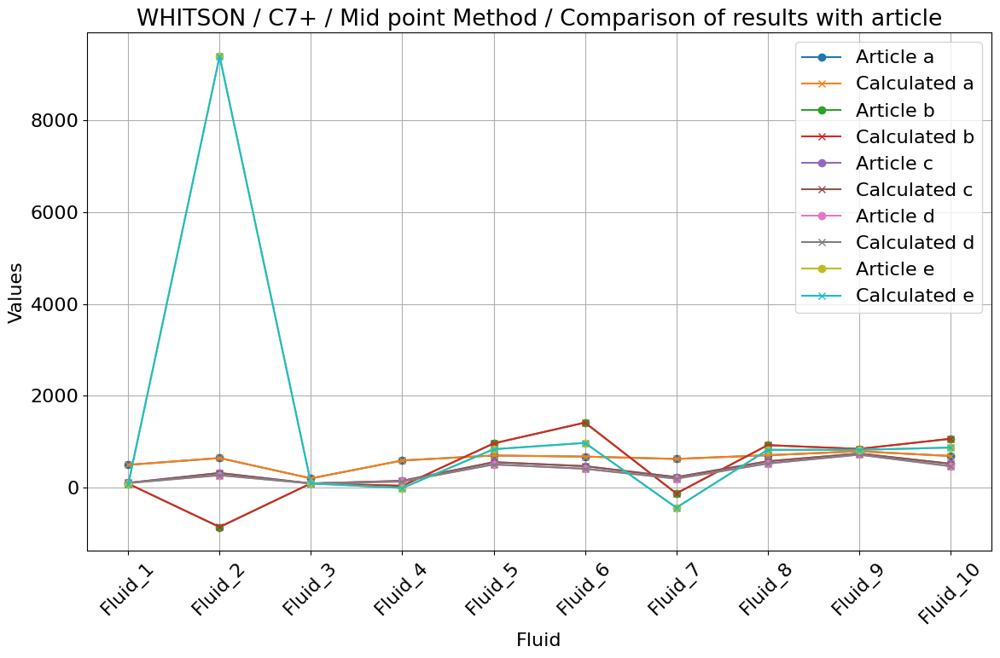

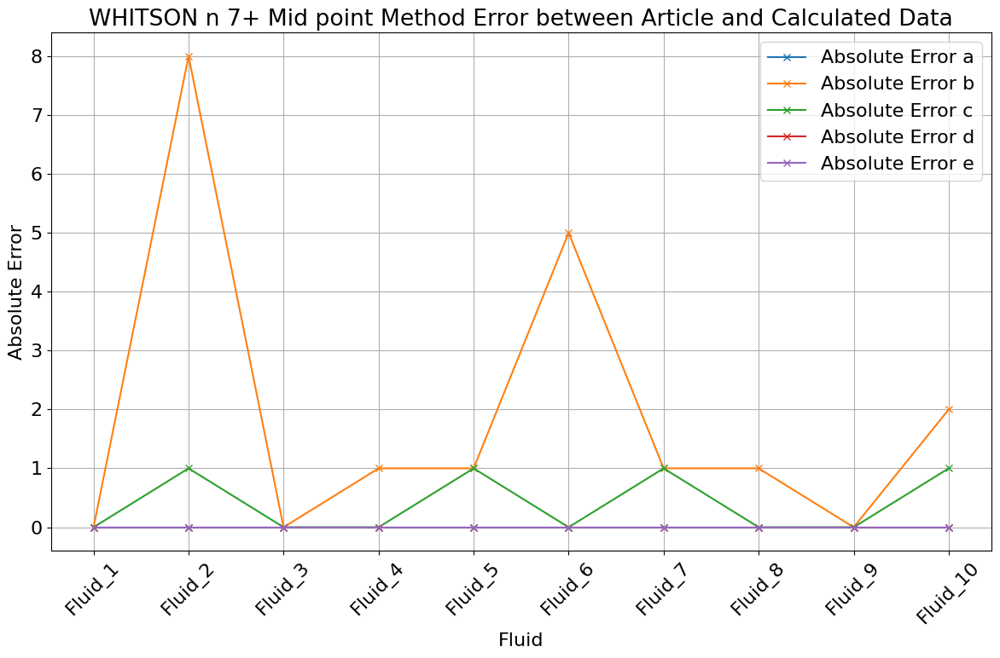

In [83]:
import pandas as pd
import matplotlib.pyplot as plt

plt.rcParams.update({'font.size': 16})

df_experimental = pd.read_excel('Table 4.xlsx', sheet_name='Table 5')

df_experimental.index = [f'Fluid_{i+1}' for i in range(len(df_experimental))]
df_experimental = df_experimental.drop("Unnamed: 0", axis=1)


M_45_plus_7_Whit_MID.columns = M_45_plus_7_Whit_MID.columns.str.replace('f_', '')
df_experimental.rename(columns={'C': 'c'}, inplace=True)

M_45_plus_7_Whit_MID.index = [f'Fluid_{i+1}' for i in range(len(M_45_plus_7_Whit_MID))]


assert df_experimental.columns.equals(M_45_plus_7_Whit_MID.columns), "Columns do not match!"


plt.figure(figsize=(12, 8))
for column in df_experimental.columns:
    plt.plot(df_experimental.index, df_experimental[column], label=f'Article {column}', marker='o')
    plt.plot(M_45_plus_7_Whit_MID.index, M_45_plus_7_Whit_MID[column], label=f'Calculated {column}', marker='x')

plt.title('WHITSON / C7+ / Mid point Method / Comparison of results with article')
plt.xlabel('Fluid')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)  
plt.tight_layout()  
plt.show()



df_absolute_error = np.round(M_45_plus_7_Whit_MID, 0) - df_experimental
plt.figure(figsize=(12, 8))
for column in df_absolute_error.columns:
    plt.plot(df_absolute_error.index, df_absolute_error[column], label=f'Absolute Error {column}', marker='x')

plt.title('WHITSON n 7+ Mid point Method Error between Article and Calculated Data')
plt.xlabel('Fluid')
plt.ylabel('Absolute Error')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)  
plt.tight_layout()  
plt.show()


# Table 6: Molecular weight of C45+ using mid point method-grouping to C11+

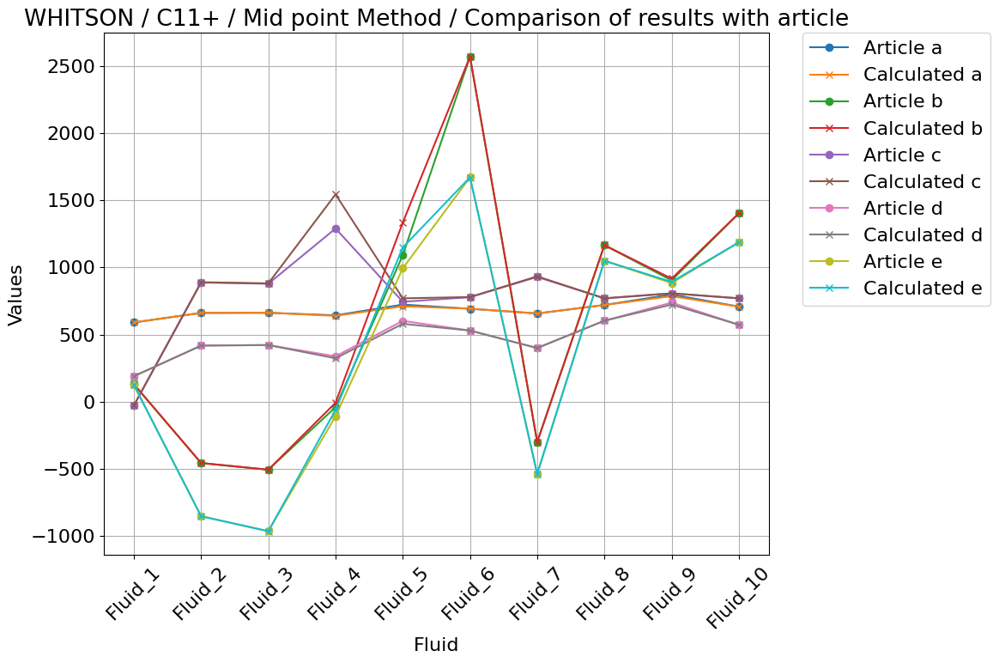

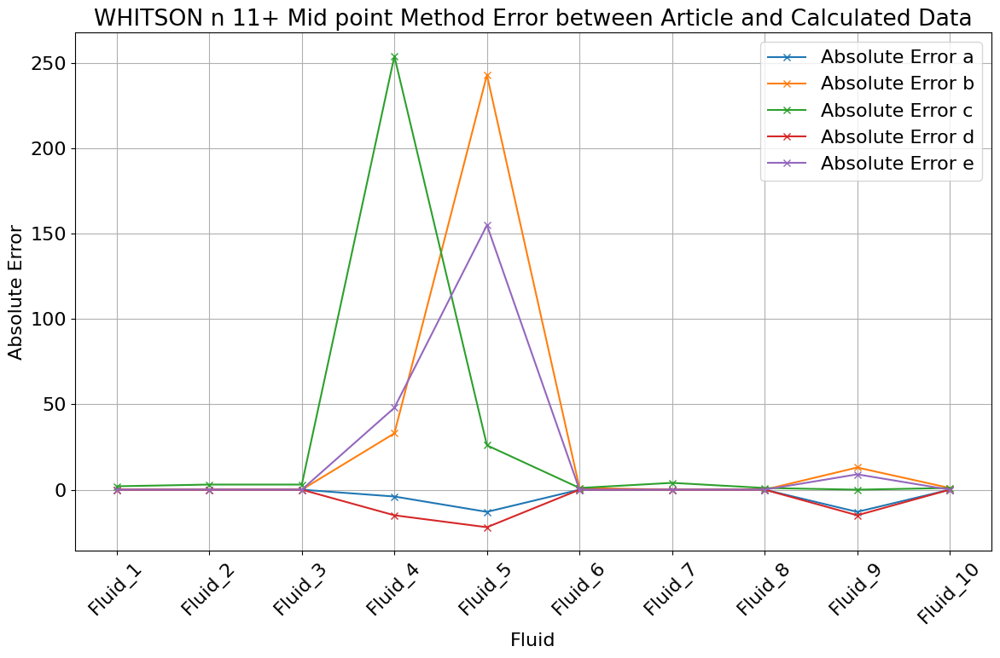

In [84]:
plt.rcParams.update({'font.size': 16})

df_experimental = pd.read_excel('Table 4.xlsx', sheet_name='Table 6')

df_experimental.index = [f'Fluid_{i+1}' for i in range(len(df_experimental))]
df_experimental = df_experimental.drop("Unnamed: 0", axis=1)


M_45_plus_11_Whit_MID.columns = M_45_plus_11_Whit_MID.columns.str.replace('f_', '')
df_experimental.rename(columns={'C': 'c'}, inplace=True)

M_45_plus_11_Whit_MID.index = [f'Fluid_{i+1}' for i in range(len(M_45_plus_11_Whit_MID))]


assert df_experimental.columns.equals(M_45_plus_11_Whit_MID.columns), "Columns do not match!"


plt.figure(figsize=(12, 8))
for column in df_experimental.columns:
    plt.plot(df_experimental.index, df_experimental[column], label=f'Article {column}', marker='o')
    plt.plot(M_45_plus_11_Whit_MID.index, M_45_plus_11_Whit_MID[column], label=f'Calculated {column}', marker='x')

plt.title('WHITSON / C11+ / Mid point Method / Comparison of results with article')
plt.xlabel('Fluid')
plt.ylabel('Values')
plt.legend(bbox_to_anchor=( 1.05 , 1 ), loc='upper left', borderaxespad= 0 )
plt.grid(True)
plt.xticks(rotation=45)  
plt.tight_layout()  
plt.show()



df_absolute_error = np.round(M_45_plus_11_Whit_MID, 0) - df_experimental
plt.figure(figsize=(12, 8))
for column in df_absolute_error.columns:
    plt.plot(df_absolute_error.index, df_absolute_error[column], label=f'Absolute Error {column}', marker='x')

plt.title('WHITSON n 11+ Mid point Method Error between Article and Calculated Data')
plt.xlabel('Fluid')
plt.ylabel('Absolute Error')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)  
plt.tight_layout()  
plt.show()


# Table 8: Molecular weight of C45+ using normal cut method-grouping to C7+

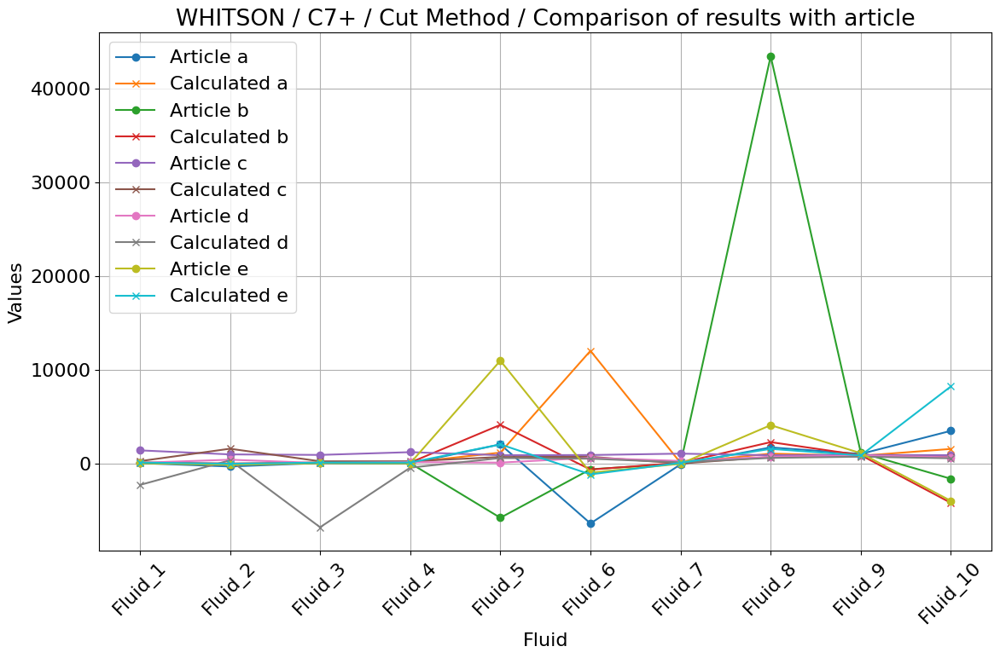

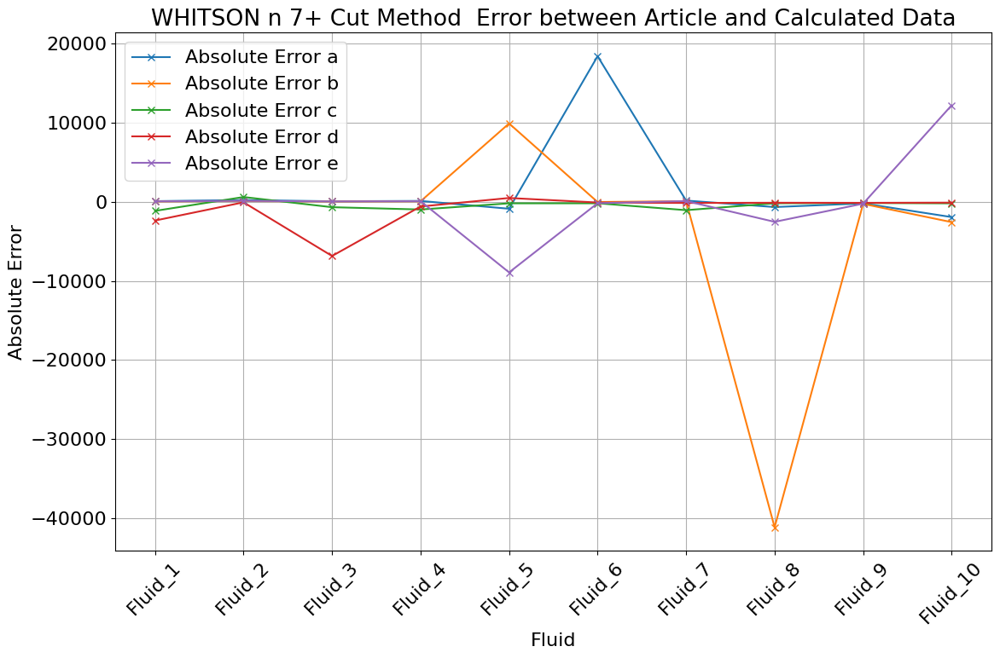

In [85]:
plt.rcParams.update({'font.size': 16})

df_experimental = pd.read_excel('Table 4.xlsx', sheet_name='Table 8')

df_experimental.index = [f'Fluid_{i+1}' for i in range(len(df_experimental))]
df_experimental = df_experimental.drop("Unnamed: 0", axis=1)


M_45_plus_7_Whit_CUT.columns = M_45_plus_7_Whit_CUT.columns.str.replace('f_', '')
df_experimental.rename(columns={'B': 'b'}, inplace=True)

M_45_plus_7_Whit_CUT.index = [f'Fluid_{i+1}' for i in range(len(M_45_plus_7_Whit_CUT))]

assert df_experimental.columns.equals(M_45_plus_7_Whit_CUT.columns), "Columns do not match!"


plt.figure(figsize=(12, 8))
for column in df_experimental.columns:
    plt.plot(df_experimental.index, df_experimental[column], label=f'Article {column}', marker='o')
    plt.plot(M_45_plus_7_Whit_CUT.index, M_45_plus_7_Whit_CUT[column], label=f'Calculated {column}', marker='x')

plt.title('WHITSON / C7+ / Cut Method / Comparison of results with article')
plt.xlabel('Fluid')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)  
plt.tight_layout()  
plt.show()



df_absolute_error = np.round(M_45_plus_7_Whit_CUT, 0) - df_experimental
plt.figure(figsize=(12, 8))
for column in df_absolute_error.columns:
    plt.plot(df_absolute_error.index, df_absolute_error[column], label=f'Absolute Error {column}', marker='x')

plt.title('WHITSON n 7+ Cut Method  Error between Article and Calculated Data')
plt.xlabel('Fluid')
plt.ylabel('Absolute Error')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)  
plt.tight_layout()  
plt.show()

# Table 9: molecular weight of C45+ normal cut method-grouping to C11+

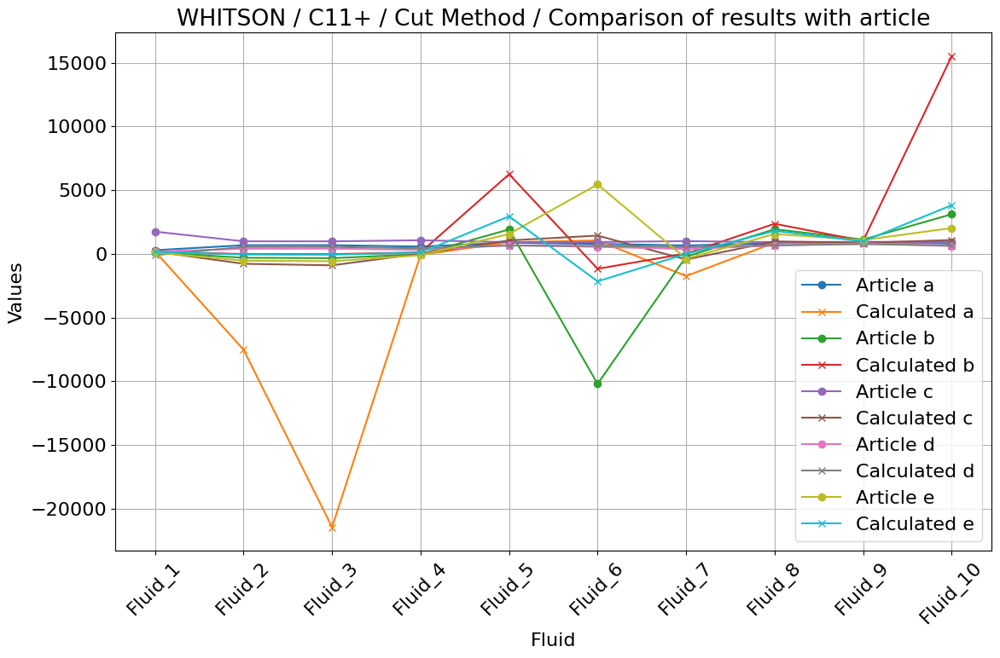

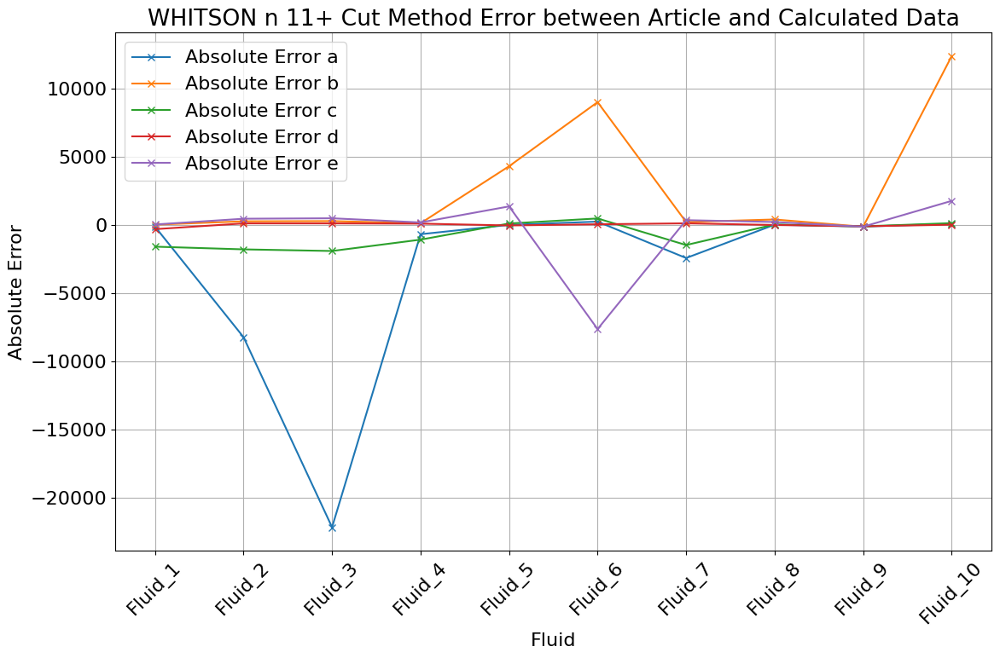

In [86]:
plt.rcParams.update({'font.size': 16})

df_experimental = pd.read_excel('Table 4.xlsx', sheet_name='Table 9')

df_experimental.index = [f'Fluid_{i+1}' for i in range(len(df_experimental))]
df_experimental = df_experimental.drop("Unnamed: 0", axis=1)


M_45_plus_11_Whit_CUT.columns = M_45_plus_11_Whit_CUT.columns.str.replace('f_', '')
df_experimental.rename(columns={'B': 'b'}, inplace=True)

M_45_plus_11_Whit_CUT.index = [f'Fluid_{i+1}' for i in range(len(M_45_plus_11_Whit_CUT))]


assert df_experimental.columns.equals(M_45_plus_11_Whit_CUT.columns), "Columns do not match!"


plt.figure(figsize=(12, 8))
for column in df_experimental.columns:
    plt.plot(df_experimental.index, df_experimental[column], label=f'Article {column}', marker='o')
    plt.plot(M_45_plus_11_Whit_CUT.index, M_45_plus_11_Whit_CUT[column], label=f'Calculated {column}', marker='x')

plt.title('WHITSON / C11+ / Cut Method / Comparison of results with article')
plt.xlabel('Fluid')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)  
plt.tight_layout()  
plt.show()



df_absolute_error = np.round(M_45_plus_11_Whit_CUT, 0) - df_experimental
plt.figure(figsize=(12, 8))
for column in df_absolute_error.columns:
    plt.plot(df_absolute_error.index, df_absolute_error[column], label=f'Absolute Error {column}', marker='x')

plt.title('WHITSON n 11+ Cut Method Error between Article and Calculated Data')
plt.xlabel('Fluid')
plt.ylabel('Absolute Error')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)  
plt.tight_layout()  
plt.show()

# Calculation of average relative error and absolute average relative error

In [87]:
def average_relative_error(actual, predicted):
    actual = np.array(actual)
    predicted = np.array(predicted)
    return np.mean((predicted - actual) / actual)

def are_calculation(table_initial, table_predicted, last_z_prediction_table):
    x = pd.DataFrame(last_z_prediction_table).T
    index_labels = list(map(lambda f_m: f"{f_m[0]}_{f_m[1]}", [(f, m) for f in ['Fluid_1', 'Fluid_2', 'Fluid_3', 'Fluid_4', 'Fluid_5','Fluid_6', 'Fluid_7', 'Fluid_8', 'Fluid_9', 'Fluid_10'] for m in ['Whitson_7', 'Whitson_11', 'Katz_7', 'Katz_11']]))
    are_table = pd.DataFrame(columns=['f_a', 'f_b', 'f_c', 'f_d', 'f_e'], index=index_labels)
    for beta in ['f_a','f_b','f_c','f_d','f_e']:
        for fluid in ['Fluid_1', 'Fluid_2', 'Fluid_3', 'Fluid_4', 'Fluid_5','Fluid_6', 'Fluid_7', 'Fluid_8', 'Fluid_9', 'Fluid_10']:
            for name in ['Whitson_7', 'Whitson_11', 'Katz_7', 'Katz_11']:
                last_z_value = x[beta].loc[name + '_z_45', fluid]
                all_z_value = (table_predicted[name + '_f_i'][beta][fluid]).to_list()
                all_z_value.append(last_z_value)

                if fluid == 'Fluid_1' or fluid == 'Fluid_8' or fluid == 'Fluid_10':
                    start_7_all_z_value = 0
                    start_11_all_z_value = 4
                    middle_point = 29 
                    start_7_fluid_composition_table = 11
                    start_11_fluid_composition_table = 15
                    last_num = 41
                    if name == 'Whitson_7' or name == 'Katz_7':
                        all_z_value_circumcision = np.concatenate([all_z_value[start_7_all_z_value:middle_point], [np.sum(all_z_value[middle_point:])]])
                        are = round(average_relative_error(table_initial[fluid].iloc[start_7_fluid_composition_table:last_num], all_z_value_circumcision), 2)
                    elif name == 'Whitson_11' or name == 'Katz_11':
                        all_z_value_circumcision = np.concatenate([all_z_value[start_11_all_z_value:middle_point], [np.sum(all_z_value[middle_point:])]])
                        are = round(average_relative_error(table_initial[fluid].iloc[start_11_fluid_composition_table:last_num], all_z_value_circumcision), 2)
                    are_table.loc[fluid + '_' + name, beta] = are

                elif fluid == 'Fluid_2' or fluid == 'Fluid_7':
                    start_7_all_z_value = 0
                    start_11_all_z_value = 4
                    middle_point = 23 
                    start_7_fluid_composition_table = 11
                    start_11_fluid_composition_table = 15
                    last_num = 35
                    if name == 'Whitson_7' or name == 'Katz_7':
                        all_z_value_circumcision = np.concatenate([all_z_value[start_7_all_z_value:middle_point], [np.sum(all_z_value[middle_point:])]])
                        are = round(average_relative_error(table_initial[fluid].iloc[start_7_fluid_composition_table:last_num], all_z_value_circumcision), 2)
                    elif name == 'Whitson_11' or name == 'Katz_11':
                        all_z_value_circumcision = np.concatenate([all_z_value[start_11_all_z_value:middle_point], [np.sum(all_z_value[middle_point:])]])
                        are = round(average_relative_error(table_initial[fluid].iloc[start_11_fluid_composition_table:last_num], all_z_value_circumcision), 2)
                    are_table.loc[fluid + '_' + name, beta] = are

                elif fluid == 'Fluid_3' or fluid == 'Fluid_4' or fluid == 'Fluid_5' or fluid == 'Fluid_6':
                    start_7_all_z_value = 0
                    start_11_all_z_value = 4
                    middle_point = 13 
                    start_7_fluid_composition_table = 11
                    start_11_fluid_composition_table = 15
                    last_num = 25
                    if name == 'Whitson_7' or name == 'Katz_7':
                        all_z_value_circumcision = np.concatenate([all_z_value[start_7_all_z_value:middle_point], [np.sum(all_z_value[middle_point:])]])
                        are = round(average_relative_error(table_initial[fluid].iloc[start_7_fluid_composition_table:last_num], all_z_value_circumcision), 2)
                    elif name == 'Whitson_11' or name == 'Katz_11':
                        all_z_value_circumcision = np.concatenate([all_z_value[start_11_all_z_value:middle_point], [np.sum(all_z_value[middle_point:])]])
                        are = round(average_relative_error(table_initial[fluid].iloc[start_11_fluid_composition_table:last_num], all_z_value_circumcision), 2)
                    are_table.loc[fluid + '_' + name, beta] = are
                    
                
                elif fluid == 'Fluid_9':
                    start_7_all_z_value = 0
                    start_11_all_z_value = 4
                    middle_point = 38 
                    start_7_fluid_composition_table = 11
                    start_11_fluid_composition_table = 15
                    last_num = 50
                    if name == 'Whitson_7' or name == 'Katz_7':
                        all_z_value_circumcision = np.concatenate([all_z_value[start_7_all_z_value:middle_point], [np.sum(all_z_value[middle_point:])]])
                        are = round(average_relative_error(table_initial[fluid].iloc[start_7_fluid_composition_table:last_num], all_z_value_circumcision), 2)
                    elif name == 'Whitson_11' or name == 'Katz_11':
                        all_z_value_circumcision = np.concatenate([all_z_value[start_11_all_z_value:middle_point], [np.sum(all_z_value[middle_point:])]])
                        are = round(average_relative_error(table_initial[fluid].iloc[start_11_fluid_composition_table:last_num], all_z_value_circumcision), 2)
                    are_table.loc[fluid + '_' + name, beta] = are
                

    return are_table

In [88]:
def absolute_average_relative_error(actual, predicted):
    actual = np.array(actual)
    predicted = np.array(predicted)
    return np.mean(np.abs(actual - predicted) / actual)

def aare_calculation(table_initial, table_predicted, last_z_prediction_table):
    x = pd.DataFrame(last_z_prediction_table).T
    index_labels = list(map(lambda f_m: f"{f_m[0]}_{f_m[1]}", [(f, m) for f in ['Fluid_1', 'Fluid_2', 'Fluid_3', 'Fluid_4', 'Fluid_5','Fluid_6', 'Fluid_7', 'Fluid_8', 'Fluid_9', 'Fluid_10'] for m in ['Whitson_7', 'Whitson_11', 'Katz_7', 'Katz_11']]))
    are_table = pd.DataFrame(columns=['f_a', 'f_b', 'f_c', 'f_d', 'f_e'], index=index_labels)
    for beta in ['f_a','f_b','f_c','f_d','f_e']:
        for fluid in ['Fluid_1', 'Fluid_2', 'Fluid_3', 'Fluid_4', 'Fluid_5','Fluid_6', 'Fluid_7', 'Fluid_8', 'Fluid_9', 'Fluid_10']:
            for name in ['Whitson_7', 'Whitson_11', 'Katz_7', 'Katz_11']:
                last_z_value = x[beta].loc[name + '_z_45', fluid]
                all_z_value = (table_predicted[name + '_f_i'][beta][fluid]).to_list()
                all_z_value.append(last_z_value)

                if fluid == 'Fluid_1' or fluid == 'Fluid_8' or fluid == 'Fluid_10':
                    start_7_all_z_value = 0
                    start_11_all_z_value = 4
                    middle_point = 29 
                    start_7_fluid_composition_table = 11
                    start_11_fluid_composition_table = 15
                    last_num = 41
                    if name == 'Whitson_7' or name == 'Katz_7':
                        all_z_value_circumcision = np.concatenate([all_z_value[start_7_all_z_value:middle_point], [np.sum(all_z_value[middle_point:])]])
                        are = round(absolute_average_relative_error(table_initial[fluid].iloc[start_7_fluid_composition_table:last_num], all_z_value_circumcision), 2)
                    elif name == 'Whitson_11' or name == 'Katz_11':
                        all_z_value_circumcision = np.concatenate([all_z_value[start_11_all_z_value:middle_point], [np.sum(all_z_value[middle_point:])]])
                        are = round(absolute_average_relative_error(table_initial[fluid].iloc[start_11_fluid_composition_table:last_num], all_z_value_circumcision), 2)
                    are_table.loc[fluid + '_' + name, beta] = are

                elif fluid == 'Fluid_2' or fluid == 'Fluid_7':
                    start_7_all_z_value = 0
                    start_11_all_z_value = 4
                    middle_point = 23 
                    start_7_fluid_composition_table = 11
                    start_11_fluid_composition_table = 15
                    last_num = 35
                    if name == 'Whitson_7' or name == 'Katz_7':
                        all_z_value_circumcision = np.concatenate([all_z_value[start_7_all_z_value:middle_point], [np.sum(all_z_value[middle_point:])]])
                        are = round(absolute_average_relative_error(table_initial[fluid].iloc[start_7_fluid_composition_table:last_num], all_z_value_circumcision), 2)
                    elif name == 'Whitson_11' or name == 'Katz_11':
                        all_z_value_circumcision = np.concatenate([all_z_value[start_11_all_z_value:middle_point], [np.sum(all_z_value[middle_point:])]])
                        are = round(absolute_average_relative_error(table_initial[fluid].iloc[start_11_fluid_composition_table:last_num], all_z_value_circumcision), 2)
                    are_table.loc[fluid + '_' + name, beta] = are

                elif fluid == 'Fluid_3' or fluid == 'Fluid_4' or fluid == 'Fluid_5' or fluid == 'Fluid_6':
                    start_7_all_z_value = 0
                    start_11_all_z_value = 4
                    middle_point = 13 
                    start_7_fluid_composition_table = 11
                    start_11_fluid_composition_table = 15
                    last_num = 25
                    if name == 'Whitson_7' or name == 'Katz_7':
                        all_z_value_circumcision = np.concatenate([all_z_value[start_7_all_z_value:middle_point], [np.sum(all_z_value[middle_point:])]])
                        are = round(absolute_average_relative_error(table_initial[fluid].iloc[start_7_fluid_composition_table:last_num], all_z_value_circumcision), 2)
                    elif name == 'Whitson_11' or name == 'Katz_11':
                        all_z_value_circumcision = np.concatenate([all_z_value[start_11_all_z_value:middle_point], [np.sum(all_z_value[middle_point:])]])
                        are = round(absolute_average_relative_error(table_initial[fluid].iloc[start_11_fluid_composition_table:last_num], all_z_value_circumcision), 2)
                    are_table.loc[fluid + '_' + name, beta] = are
                    
                
                elif fluid == 'Fluid_9':
                    start_7_all_z_value = 0
                    start_11_all_z_value = 4
                    middle_point = 38 
                    start_7_fluid_composition_table = 11
                    start_11_fluid_composition_table = 15
                    last_num = 50
                    if name == 'Whitson_7' or name == 'Katz_7':
                        all_z_value_circumcision = np.concatenate([all_z_value[start_7_all_z_value:middle_point], [np.sum(all_z_value[middle_point:])]])
                        are = round(absolute_average_relative_error(table_initial[fluid].iloc[start_7_fluid_composition_table:last_num], all_z_value_circumcision), 2)
                    elif name == 'Whitson_11' or name == 'Katz_11':
                        all_z_value_circumcision = np.concatenate([all_z_value[start_11_all_z_value:middle_point], [np.sum(all_z_value[middle_point:])]])
                        are = round(absolute_average_relative_error(table_initial[fluid].iloc[start_11_fluid_composition_table:last_num], all_z_value_circumcision), 2)
                    are_table.loc[fluid + '_' + name, beta] = are
                

    return are_table



In [89]:
are_calculation(fluid_composition_table, dataframes_midpoint_z_M, z_values_mid_point)

,f_a,f_b,f_c,f_d,f_e
Fluid_1_Whitson_7,-0.07,-0.4,0.28,0.46,-0.27
Fluid_1_Whitson_11,-0.0,-0.42,-0.08,0.23,-0.35
Fluid_1_Katz_7,-0.05,-0.44,0.24,0.27,-0.31
Fluid_1_Katz_11,0.0,-0.41,-0.07,0.24,-0.34
Fluid_2_Whitson_7,-0.03,-0.03,-0.02,-0.02,-0.03
Fluid_2_Whitson_11,-0.1,-0.08,-0.1,-0.12,-0.08
Fluid_2_Katz_7,-0.01,-0.02,-0.01,-0.01,-0.02
Fluid_2_Katz_11,-0.08,-0.06,-0.08,-0.1,-0.06
Fluid_3_Whitson_7,0.07,0.02,0.12,0.14,0.04
Fluid_3_Whitson_11,-0.02,0.01,-0.01,-0.04,0.01


In [90]:
aare_calculation(fluid_composition_table, dataframes_midpoint_z_M, z_values_mid_point)

,f_a,f_b,f_c,f_d,f_e
Fluid_1_Whitson_7,0.22,0.57,0.5,0.65,0.43
Fluid_1_Whitson_11,0.15,0.57,0.18,0.39,0.49
Fluid_1_Katz_7,0.24,0.64,0.46,0.49,0.5
Fluid_1_Katz_11,0.14,0.59,0.22,0.38,0.51
Fluid_2_Whitson_7,0.33,0.33,0.35,0.36,0.32
Fluid_2_Whitson_11,0.32,0.33,0.31,0.33,0.32
Fluid_2_Katz_7,0.29,0.31,0.31,0.31,0.29
Fluid_2_Katz_11,0.27,0.3,0.26,0.28,0.28
Fluid_3_Whitson_7,0.21,0.31,0.24,0.29,0.27
Fluid_3_Whitson_11,0.3,0.22,0.28,0.36,0.23


In [91]:
are_calculation(fluid_composition_table, dataframes_Normal_Cut_z_M, z_values_Normal_cut)

,f_a,f_b,f_c,f_d,f_e
Fluid_1_Whitson_7,-0.54,-0.93,-0.14,0.07,-0.78
Fluid_1_Whitson_11,-0.17,-0.65,-0.25,0.1,-0.56
Fluid_1_Katz_7,-0.27,-0.7,0.04,0.07,-0.56
Fluid_1_Katz_11,-0.16,-0.62,-0.24,0.11,-0.54
Fluid_2_Whitson_7,-0.01,-0.02,-0.01,-0.01,-0.02
Fluid_2_Whitson_11,-0.08,-0.06,-0.08,-0.1,-0.06
Fluid_2_Katz_7,0.01,0.0,0.01,0.01,0.0
Fluid_2_Katz_11,-0.06,-0.04,-0.06,-0.08,-0.04
Fluid_3_Whitson_7,0.07,0.02,0.13,0.15,0.04
Fluid_3_Whitson_11,0.01,0.05,0.02,-0.02,0.04


In [92]:
aare_calculation(fluid_composition_table, dataframes_Normal_Cut_z_M, z_values_Normal_cut)

,f_a,f_b,f_c,f_d,f_e
Fluid_1_Whitson_7,0.79,1.2,0.39,0.22,1.04
Fluid_1_Whitson_11,0.4,0.94,0.49,0.22,0.84
Fluid_1_Katz_7,0.59,1.01,0.3,0.27,0.87
Fluid_1_Katz_11,0.42,0.94,0.51,0.2,0.85
Fluid_2_Whitson_7,0.35,0.4,0.32,0.33,0.38
Fluid_2_Whitson_11,0.29,0.37,0.29,0.31,0.35
Fluid_2_Katz_7,0.31,0.36,0.3,0.3,0.34
Fluid_2_Katz_11,0.24,0.33,0.26,0.26,0.32
Fluid_3_Whitson_7,0.42,0.56,0.29,0.23,0.5
Fluid_3_Whitson_11,0.28,0.23,0.27,0.33,0.24


# Comparison plots for experimental and modeled data

In [93]:
def plot_data(table_initial, table_predicted, last_z_prediction_table, method):
    x = pd.DataFrame(last_z_prediction_table).T
    index_labels = list(map(lambda f_m: f"{f_m[0]}_{f_m[1]}", [(f, m) for f in ['Fluid_1', 'Fluid_2', 'Fluid_3', 'Fluid_4', 'Fluid_5','Fluid_6', 'Fluid_7', 'Fluid_8', 'Fluid_9', 'Fluid_10'] for m in ['Whitson_7', 'Whitson_11', 'Katz_7', 'Katz_11']]))
    for beta in ['f_a','f_b','f_c','f_d','f_e']:
        for fluid in ['Fluid_1', 'Fluid_2', 'Fluid_3', 'Fluid_4', 'Fluid_5','Fluid_6', 'Fluid_7', 'Fluid_8', 'Fluid_9', 'Fluid_10']:
            for name in ['Whitson_7', 'Whitson_11', 'Katz_7', 'Katz_11']:
                last_z_value = x[beta].loc[name + '_z_45', fluid]
                all_z_value = (table_predicted[name + '_f_i'][beta][fluid]).to_list()
                all_z_value.append(last_z_value)
                # print(len(all_z_value))
                if fluid == 'Fluid_1' or fluid == 'Fluid_8' or fluid == 'Fluid_10':
                    start_7_all_z_value = 0
                    start_11_all_z_value = 4
                    middle_point = 29 #+7 
                    start_7_fluid_composition_table = 11
                    start_11_fluid_composition_table = 15
                    last_num = 41 
                    if name == 'Whitson_7' or name == 'Katz_7':
                        all_z_value_circumcision = np.concatenate([all_z_value[start_7_all_z_value:middle_point], [np.sum(all_z_value[middle_point:])]])
                        # print(len(all_z_value_circumcision))
                        plt.scatter(np.arange(7, 37), all_z_value_circumcision, label='Modeled')
                        plt.scatter(np.arange(7, 37), table_initial[fluid].iloc[start_7_fluid_composition_table:last_num], label='Experimental')
                        plt.xlabel('SCN')
                        plt.ylabel('Mole fraction')
                        plt.title(f'{name}, {fluid}, {method}')
                        plt.grid(True)
                        plt.yscale('log')
                        plt.ylim(0.0000001, 1)
                        plt.xlim(0, 50)
                        plt.legend()
                        plt.show()
                    elif name == 'Whitson_11' or name == 'Katz_11':
                        all_z_value_circumcision = np.concatenate([all_z_value[start_11_all_z_value:middle_point], [np.sum(all_z_value[middle_point:])]])
                        # print(len(all_z_value_circumcision))
                        plt.scatter(np.arange(11, 37), all_z_value_circumcision, label='Modeled')
                        plt.scatter(np.arange(11, 37), table_initial[fluid].iloc[start_11_fluid_composition_table:last_num], label='Experimental')
                        plt.xlabel('SCN')
                        plt.ylabel('Mole fraction')
                        plt.title(f'{name}, {fluid}, {method}')
                        plt.grid(True)
                        plt.yscale('log')
                        plt.ylim(0.0000001, 1)
                        plt.xlim(0, 50)
                        plt.legend()
                        plt.show()
                    

                elif fluid == 'Fluid_2' or fluid == 'Fluid_7':
                    start_7_all_z_value = 0
                    start_11_all_z_value = 4
                    middle_point = 23 
                    start_7_fluid_composition_table = 11
                    start_11_fluid_composition_table = 15
                    last_num = 35
                    if name == 'Whitson_7' or name == 'Katz_7':
                        all_z_value_circumcision = np.concatenate([all_z_value[start_7_all_z_value:middle_point], [np.sum(all_z_value[middle_point:])]])
                        plt.scatter(np.arange(7, 31), all_z_value_circumcision, label='Modeled')
                        plt.scatter(np.arange(7, 31), table_initial[fluid].iloc[start_7_fluid_composition_table:last_num], label='Experimental')
                        plt.xlabel('SCN')
                        plt.ylabel('Mole fraction')
                        plt.title(f'{name}, {fluid}, {method}')
                        plt.grid(True)
                        plt.yscale('log')
                        plt.ylim(0.0000001, 1)
                        plt.xlim(0, 50)
                        plt.legend()
                        plt.show()                    
                    elif name == 'Whitson_11' or name == 'Katz_11':
                        all_z_value_circumcision = np.concatenate([all_z_value[start_11_all_z_value:middle_point], [np.sum(all_z_value[middle_point:])]])
                        plt.scatter(np.arange(11, 31), all_z_value_circumcision, label='Modeled')
                        plt.scatter(np.arange(11, 31), table_initial[fluid].iloc[start_11_fluid_composition_table:last_num], label='Experimental')
                        plt.xlabel('SCN')
                        plt.ylabel('Mole fraction')
                        plt.title(f'{name}, {fluid}, {method}')
                        plt.grid(True)
                        plt.yscale('log')
                        plt.ylim(0.0000001, 1)
                        plt.xlim(0, 50)
                        plt.legend()
                        plt.show()

                elif fluid == 'Fluid_3' or fluid == 'Fluid_4' or fluid == 'Fluid_5' or fluid == 'Fluid_6':
                    start_7_all_z_value = 0
                    start_11_all_z_value = 4
                    middle_point = 13 
                    start_7_fluid_composition_table = 11
                    start_11_fluid_composition_table = 15
                    last_num = 25
                    if name == 'Whitson_7' or name == 'Katz_7':
                        all_z_value_circumcision = np.concatenate([all_z_value[start_7_all_z_value:middle_point], [np.sum(all_z_value[middle_point:])]])
                        plt.scatter(np.arange(7, 21), all_z_value_circumcision, label='Modeled')
                        plt.scatter(np.arange(7, 21), table_initial[fluid].iloc[start_7_fluid_composition_table:last_num], label='Experimental')
                        plt.xlabel('SCN')
                        plt.ylabel('Mole fraction')
                        plt.title(f'{name}, {fluid}, {method}')
                        plt.grid(True)
                        plt.yscale('log')
                        plt.ylim(0.0000001, 1)
                        plt.xlim(0, 50)
                        plt.legend()
                        plt.show()
                    elif name == 'Whitson_11' or name == 'Katz_11':
                        all_z_value_circumcision = np.concatenate([all_z_value[start_11_all_z_value:middle_point], [np.sum(all_z_value[middle_point:])]])
                        plt.scatter(np.arange(11, 21), all_z_value_circumcision, label='Modeled')
                        plt.scatter(np.arange(11, 21), table_initial[fluid].iloc[start_11_fluid_composition_table:last_num], label='Experimental')
                        plt.xlabel('SCN')
                        plt.ylabel('Mole fraction')
                        plt.title(f'{name}, {fluid}, {method}')
                        plt.grid(True)
                        plt.yscale('log')
                        plt.ylim(0.0000001, 1)
                        plt.xlim(0, 50)
                        plt.legend()
                        plt.show()
                    
                
                elif fluid == 'Fluid_9':
                    start_7_all_z_value = 0
                    start_11_all_z_value = 4
                    middle_point = 38 
                    start_7_fluid_composition_table = 11
                    start_11_fluid_composition_table = 15
                    last_num = 50
                    if name == 'Whitson_7' or name == 'Katz_7':
                        all_z_value_circumcision = np.concatenate([all_z_value[start_7_all_z_value:middle_point], [np.sum(all_z_value[middle_point:])]])
                        plt.scatter(np.arange(7, 46), all_z_value_circumcision, label='Modeled')
                        plt.scatter(np.arange(7, 46), table_initial[fluid].iloc[start_7_fluid_composition_table:last_num], label='Experimental')
                        plt.xlabel('SCN')
                        plt.ylabel('Mole fraction')
                        plt.title(f'{name}, {fluid}, {method}')
                        plt.grid(True)
                        plt.yscale('log')
                        plt.ylim(0.0000001, 1)
                        plt.xlim(0, 50)
                        plt.legend()
                        plt.show()
                    elif name == 'Whitson_11' or name == 'Katz_11':
                        all_z_value_circumcision = np.concatenate([all_z_value[start_11_all_z_value:middle_point], [np.sum(all_z_value[middle_point:])]])
                        plt.scatter(np.arange(11, 46), all_z_value_circumcision, label='Modeled')
                        plt.scatter(np.arange(11, 46), table_initial[fluid].iloc[start_11_fluid_composition_table:last_num], label='Experimental')
                        plt.xlabel('SCN')
                        plt.ylabel('Mole fraction')
                        plt.title(f'{name}, {fluid}, {method}')
                        plt.grid(True)
                        plt.yscale('log')
                        plt.ylim(0.0000001, 1)
                        plt.xlim(0, 50)
                        plt.legend()
                        plt.show()

# Visualization

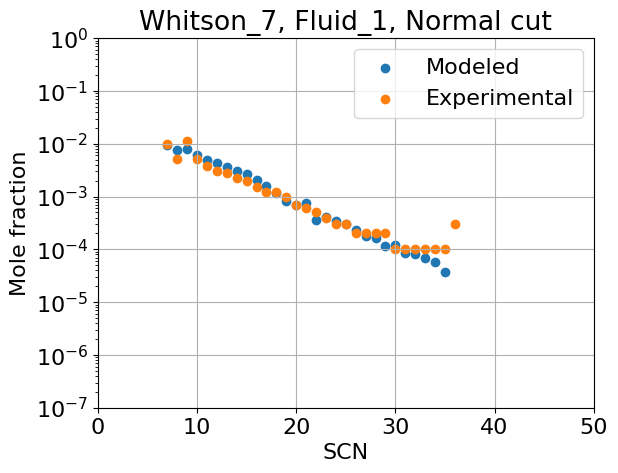

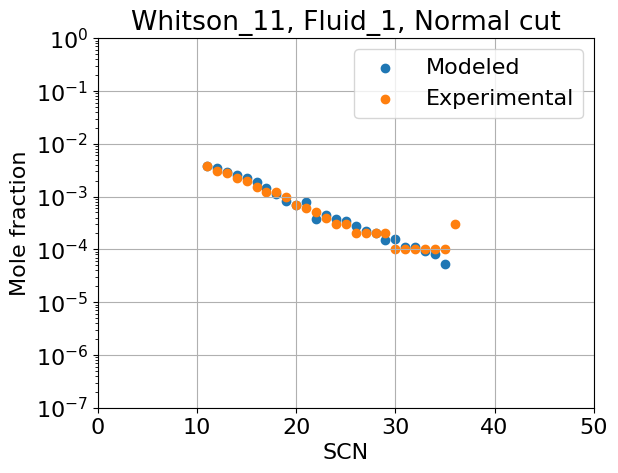

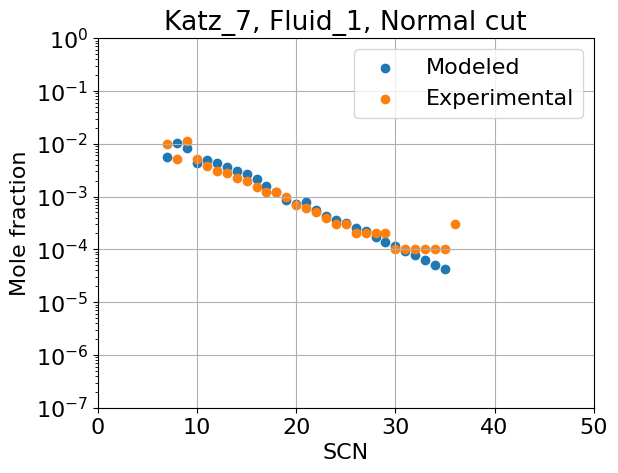

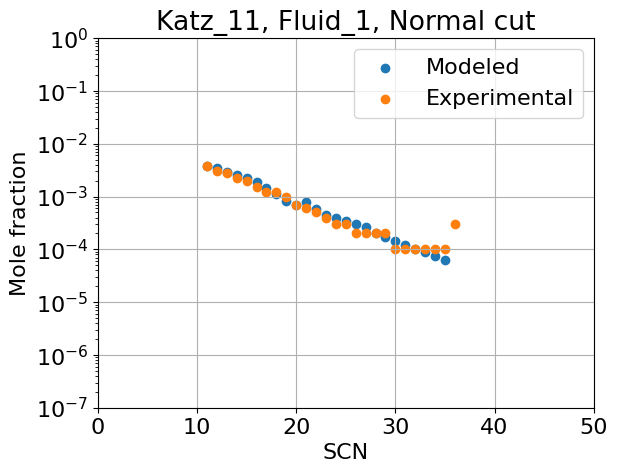

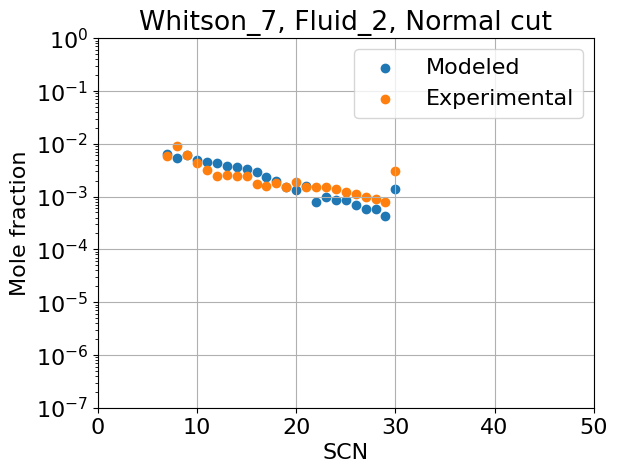

...

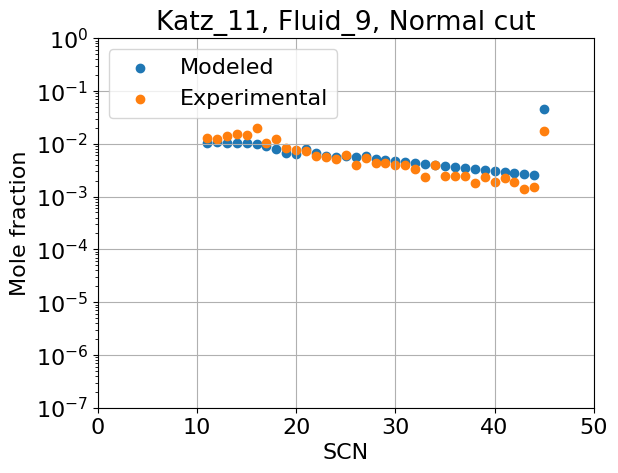

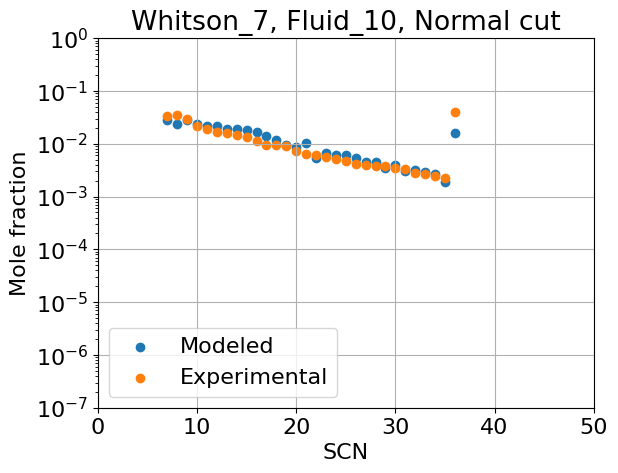

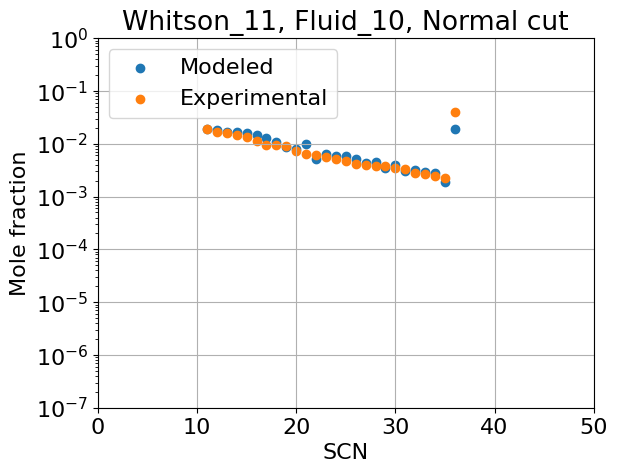

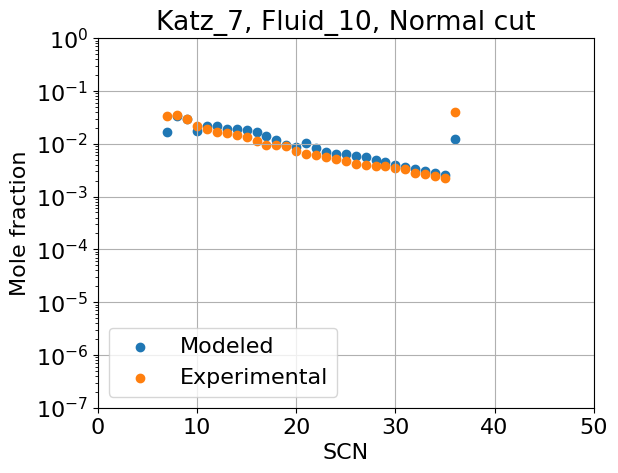

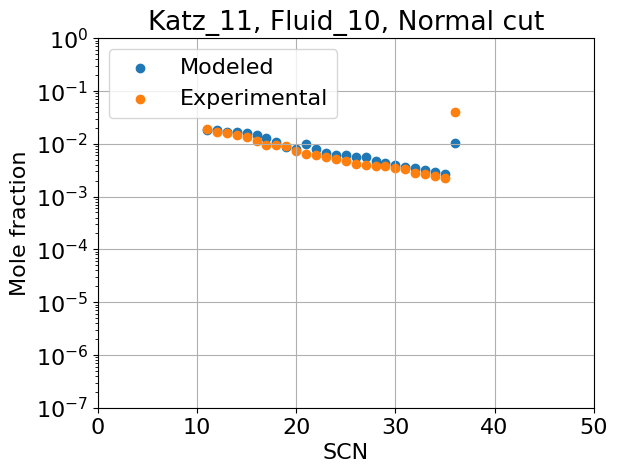

In [94]:
plot_data(fluid_composition_table, dataframes_Normal_Cut_z_M, z_values_Normal_cut, 'Normal cut')

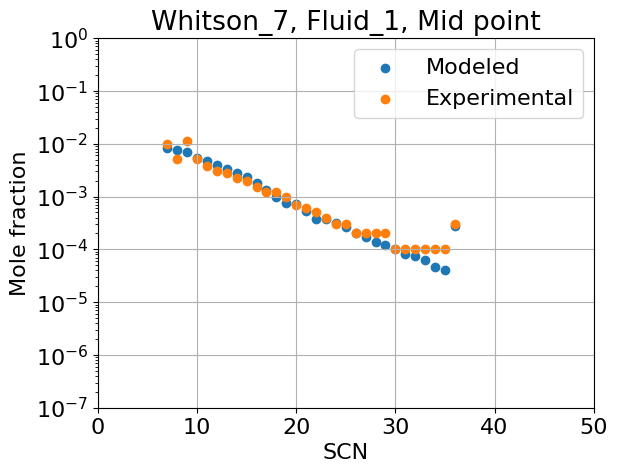

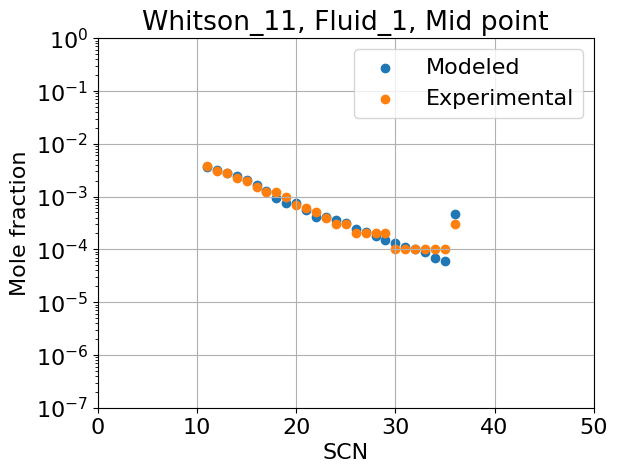

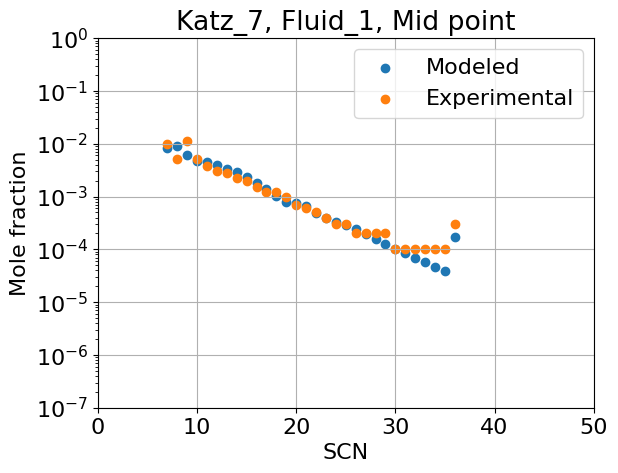

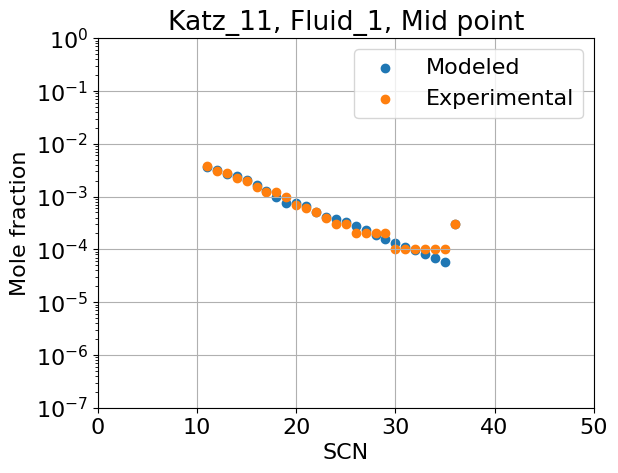

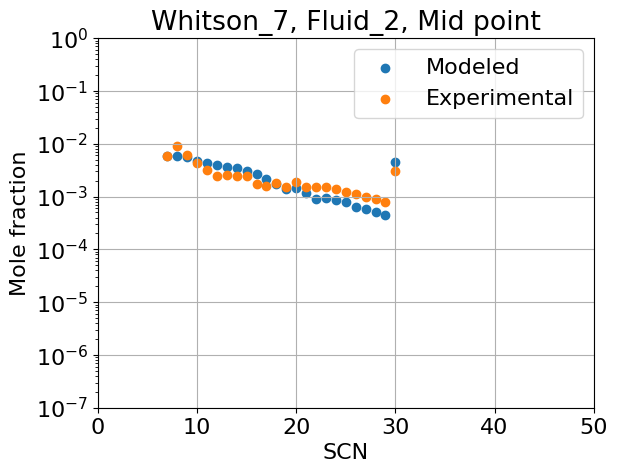

...

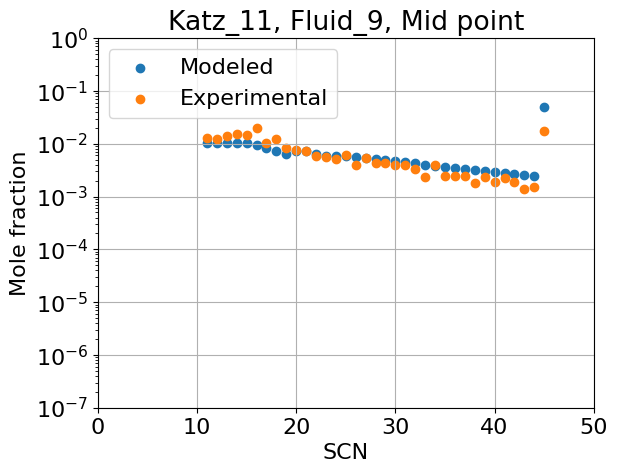

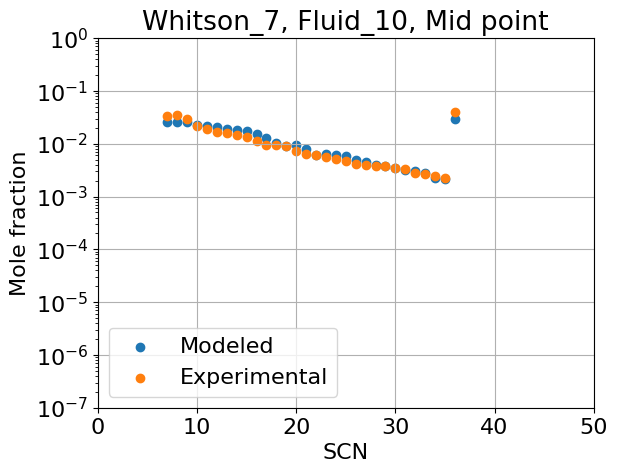

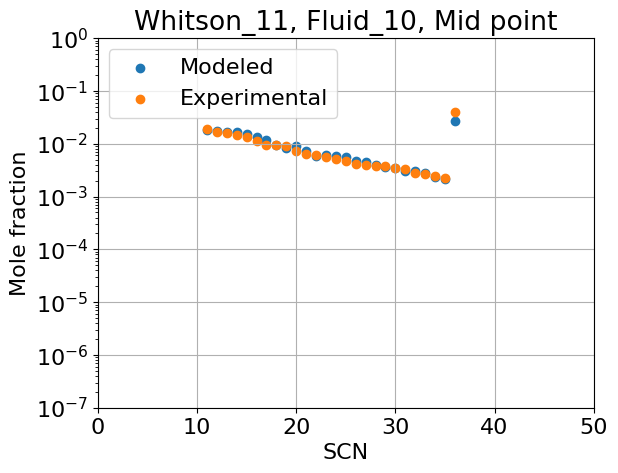

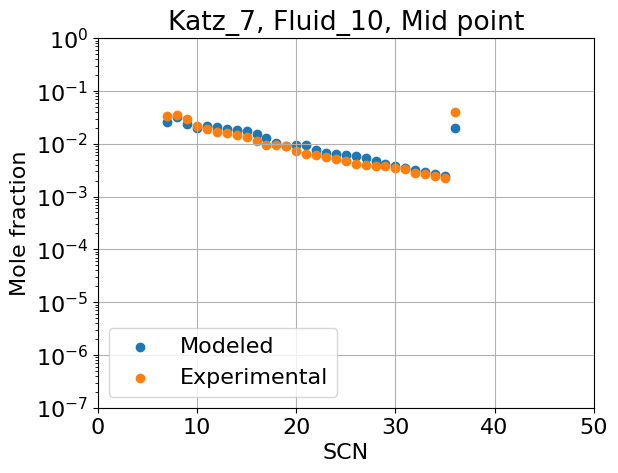

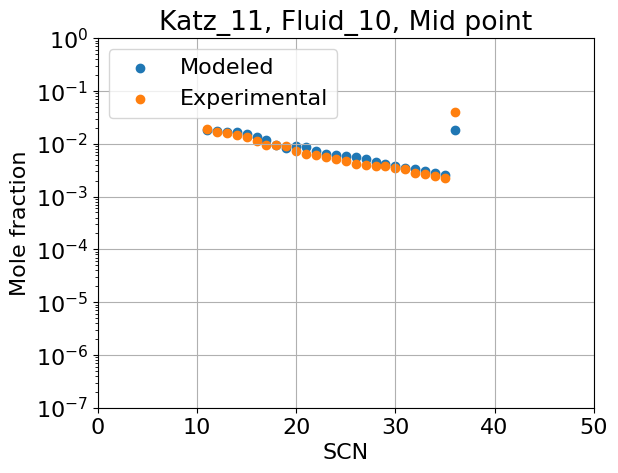

In [95]:
plot_data(fluid_composition_table, dataframes_midpoint_z_M, z_values_mid_point, 'Mid point')